# Taller Modelos Color Percepcion - Python (Colab/Jupyter)

Este notebook implementa los puntos solicitados en el taller:

- Conversiones de color: RGB -> HSV y RGB -> CIE Lab
- Visualizacion de canales individuales y su efecto perceptual
- Simulacion de daltonismo (protanopia y deuteranopia)
- Simulacion de baja luz (brillo/contraste)
- Transformaciones personalizadas (temperatura, inversion, monocromo)
- Bonus: funcion para alternar dinamicamente entre modelos/simulaciones

Las imagenes de entrada se buscan en carpetas `images` o `media`, y los resultados se guardan en `../media` (o `media` en Colab).

In [ ]:
# Si trabajas en Colab/Jupyter y faltan paquetes, descomenta la siguiente linea:
# %pip install -q opencv-python scikit-image matplotlib numpy

In [1]:
import os
from pathlib import Path
import colorsys

import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import color

plt.rcParams['figure.figsize'] = (14, 8)
plt.rcParams['axes.grid'] = False

## 1) Carga de imagenes y configuracion de rutas

In [2]:
def resolve_input_dirs() -> list[Path]:
    """Detecta directorios de entrada compatibles con VS Code/Jupyter/Colab."""
    cwd = Path.cwd()
    candidates = [
        cwd / 'images',
        cwd / 'media',
        cwd.parent / 'images',
        cwd.parent / 'media',
        Path('/content/images'),
        Path('/content/media'),
    ]
    return [p for p in candidates if p.exists() and p.is_dir()]

def find_images(input_dirs: list[Path]) -> list[Path]:
    exts = {'.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff', '.webp'}
    files = []
    for directory in input_dirs:
        files.extend([p for p in directory.iterdir() if p.suffix.lower() in exts and p.is_file()])
    # Elimina duplicados manteniendo orden
    seen = set()
    unique = []
    for f in files:
        key = str(f.resolve())
        if key not in seen:
            seen.add(key)
            unique.append(f)
    return unique

def load_rgb_image(path: Path) -> np.ndarray:
    bgr = cv2.imread(str(path), cv2.IMREAD_COLOR)
    if bgr is None:
        raise ValueError(f'No se pudo cargar la imagen: {path}')
    return cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)

INPUT_DIRS = resolve_input_dirs()
IMAGE_PATHS = find_images(INPUT_DIRS)

if not IMAGE_PATHS:
    raise FileNotFoundError(
        'No se encontraron imagenes. Coloca archivos en images/ o media/.'
    )

OUTPUT_DIR = Path('../media') if (Path.cwd().name == 'python') else Path('media')
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

print('Directorios detectados:')
for d in INPUT_DIRS:
    print(' -', d)

print(f'\nImagenes encontradas: {len(IMAGE_PATHS)}')
for i, p in enumerate(IMAGE_PATHS):
    print(f'[{i}] {p.name}')

print(f'\nCarpeta de salida: {OUTPUT_DIR.resolve()}')

Directorios detectados:
 - c:\Users\Juant\OneDrive\Desktop\Juan\Universidad\Visual-Computing-2026\Semana_04_Computacion_Radiometrica_Color\semana_04_2_modelos_color_percepcion\media

Imagenes encontradas: 12
[0] image1.jpg
[1] image1_baja_luz.png
[2] image1_conversion_canales.png
[3] image1_daltonismo.png
[4] image1_lab_canales.png
[5] image1_transformaciones.png
[6] image2.jpg
[7] image2_baja_luz.png
[8] image2_conversion_canales.png
[9] image2_daltonismo.png
[10] image2_lab_canales.png
[11] image2_transformaciones.png

Carpeta de salida: C:\Users\Juant\OneDrive\Desktop\Juan\Universidad\Visual-Computing-2026\Semana_04_Computacion_Radiometrica_Color\semana_04_2_modelos_color_percepcion\media


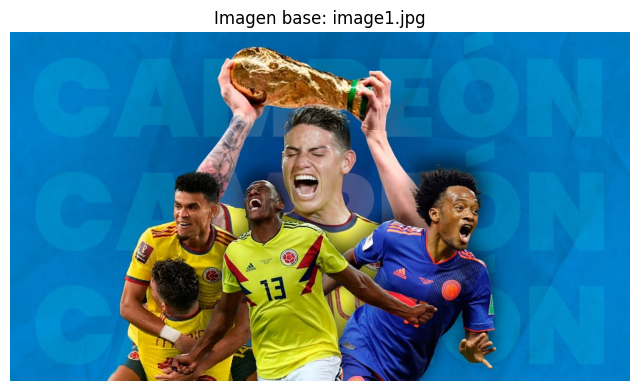

Color promedio (RGB normalizado): [0.193 0.445 0.555]
Color promedio (HSV via colorsys): (np.float64(0.551), np.float64(0.653), np.float64(0.555))


In [3]:
# Selecciona que imagen procesar (indice en IMAGE_PATHS)
IMAGE_INDEX = 0
image_path = IMAGE_PATHS[IMAGE_INDEX]
img_rgb = load_rgb_image(image_path)

# Uso de colorsys para reportar el color promedio en HSV (referencia perceptual rapida)
mean_rgb = img_rgb.reshape(-1, 3).mean(axis=0) / 255.0
mean_hsv = colorsys.rgb_to_hsv(*mean_rgb)

plt.figure(figsize=(8, 5))
plt.imshow(img_rgb)
plt.title(f'Imagen base: {image_path.name}')
plt.axis('off')
plt.show()

print('Color promedio (RGB normalizado):', np.round(mean_rgb, 3))
print('Color promedio (HSV via colorsys):', tuple(np.round(mean_hsv, 3)))

## 2) Conversion RGB -> HSV y RGB -> CIE Lab + canales

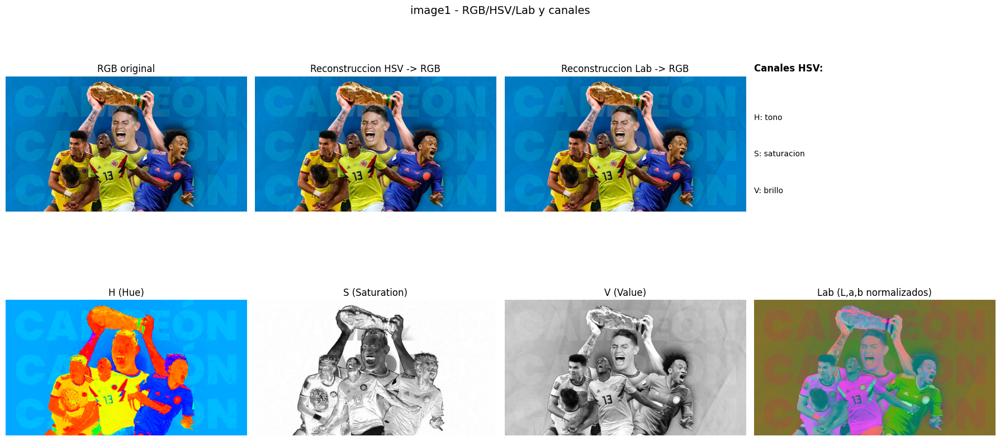

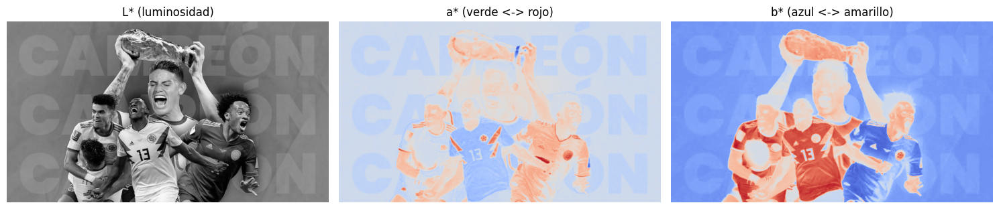

Guardado: image1_conversion_canales.png
Guardado: image1_lab_canales.png


In [4]:
def plot_color_spaces_and_channels(img_rgb: np.ndarray, title_prefix: str, out_prefix: str):
    # Conversiones
    img_hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
    img_lab = color.rgb2lab(img_rgb / 255.0)

    # Canales HSV (OpenCV: H en [0,179], S/V en [0,255])
    h, s, v = cv2.split(img_hsv)

    # Canales Lab (L*: 0..100, a*/b* aprox -128..127)
    l = img_lab[:, :, 0]
    a = img_lab[:, :, 1]
    b = img_lab[:, :, 2]

    fig, axes = plt.subplots(2, 4, figsize=(18, 9))
    fig.suptitle(f'{title_prefix} - RGB/HSV/Lab y canales', fontsize=14)

    axes[0, 0].imshow(img_rgb)
    axes[0, 0].set_title('RGB original')
    axes[0, 0].axis('off')

    axes[0, 1].imshow(cv2.cvtColor(img_hsv, cv2.COLOR_HSV2RGB))
    axes[0, 1].set_title('Reconstruccion HSV -> RGB')
    axes[0, 1].axis('off')

    # Para visualizar Lab correctamente, convertir de vuelta a RGB
    lab_to_rgb = np.clip(color.lab2rgb(img_lab), 0, 1)
    axes[0, 2].imshow(lab_to_rgb)
    axes[0, 2].set_title('Reconstruccion Lab -> RGB')
    axes[0, 2].axis('off')

    axes[0, 3].axis('off')
    axes[0, 3].text(0.0, 0.8, 'Canales HSV:', fontsize=12, weight='bold')
    axes[0, 3].text(0.0, 0.6, 'H: tono')
    axes[0, 3].text(0.0, 0.45, 'S: saturacion')
    axes[0, 3].text(0.0, 0.3, 'V: brillo')

    axes[1, 0].imshow(h, cmap='hsv')
    axes[1, 0].set_title('H (Hue)')
    axes[1, 0].axis('off')

    axes[1, 1].imshow(s, cmap='gray')
    axes[1, 1].set_title('S (Saturation)')
    axes[1, 1].axis('off')

    axes[1, 2].imshow(v, cmap='gray')
    axes[1, 2].set_title('V (Value)')
    axes[1, 2].axis('off')

    # Resumen Lab en falso color
    l_norm = (l - l.min()) / (l.max() - l.min() + 1e-8)
    a_norm = (a - a.min()) / (a.max() - a.min() + 1e-8)
    b_norm = (b - b.min()) / (b.max() - b.min() + 1e-8)
    lab_channels_rgb = np.dstack([l_norm, a_norm, b_norm])
    axes[1, 3].imshow(lab_channels_rgb)
    axes[1, 3].set_title('Lab (L,a,b normalizados)')
    axes[1, 3].axis('off')

    plt.tight_layout()
    out_path = OUTPUT_DIR / f'{out_prefix}_conversion_canales.png'
    fig.savefig(out_path, dpi=150, bbox_inches='tight')
    plt.show()

    # Figura extra para ver canales Lab por separado
    fig2, ax2 = plt.subplots(1, 3, figsize=(15, 4))
    ax2[0].imshow(l, cmap='gray')
    ax2[0].set_title('L* (luminosidad)')
    ax2[0].axis('off')

    ax2[1].imshow(a, cmap='coolwarm')
    ax2[1].set_title('a* (verde <-> rojo)')
    ax2[1].axis('off')

    ax2[2].imshow(b, cmap='coolwarm')
    ax2[2].set_title('b* (azul <-> amarillo)')
    ax2[2].axis('off')

    plt.tight_layout()
    out_path2 = OUTPUT_DIR / f'{out_prefix}_lab_canales.png'
    fig2.savefig(out_path2, dpi=150, bbox_inches='tight')
    plt.show()

    return img_hsv, img_lab

img_hsv, img_lab = plot_color_spaces_and_channels(img_rgb, image_path.stem, image_path.stem)
print('Guardado:', (OUTPUT_DIR / f'{image_path.stem}_conversion_canales.png').name)
print('Guardado:', (OUTPUT_DIR / f'{image_path.stem}_lab_canales.png').name)

## 3) Simulacion de daltonismo (protanopia y deuteranopia)

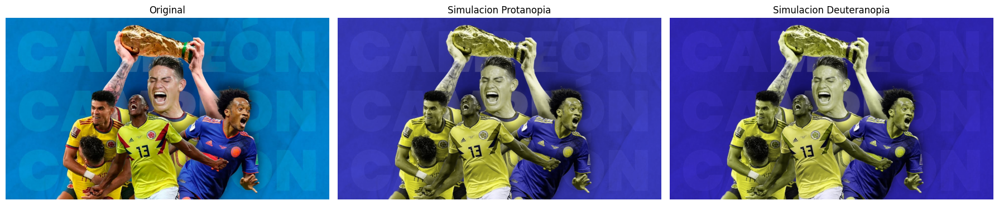

Guardado: image1_daltonismo.png


In [5]:
def apply_color_matrix(img_rgb: np.ndarray, matrix: np.ndarray) -> np.ndarray:
    """Aplica una matriz 3x3 sobre RGB normalizado."""
    img = img_rgb.astype(np.float32) / 255.0
    transformed = np.tensordot(img, matrix.T, axes=1)
    transformed = np.clip(transformed, 0.0, 1.0)
    return (transformed * 255).astype(np.uint8)

# Matrices aproximadas de simulacion (modelo lineal simple)
PROTANOPIA_MAT = np.array([
    [0.567, 0.433, 0.000],
    [0.558, 0.442, 0.000],
    [0.000, 0.242, 0.758]
], dtype=np.float32)

DEUTERANOPIA_MAT = np.array([
    [0.625, 0.375, 0.000],
    [0.700, 0.300, 0.000],
    [0.000, 0.300, 0.700]
], dtype=np.float32)

img_prot = apply_color_matrix(img_rgb, PROTANOPIA_MAT)
img_deut = apply_color_matrix(img_rgb, DEUTERANOPIA_MAT)

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(img_rgb)
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].imshow(img_prot)
ax[1].set_title('Simulacion Protanopia')
ax[1].axis('off')

ax[2].imshow(img_deut)
ax[2].set_title('Simulacion Deuteranopia')
ax[2].axis('off')

plt.tight_layout()
out_path = OUTPUT_DIR / f'{image_path.stem}_daltonismo.png'
fig.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()

print('Guardado:', out_path.name)

## 4) Simulacion de baja luz (brillo y contraste)

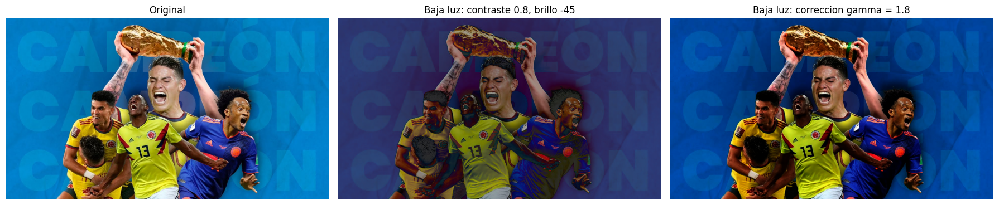

Guardado: image1_baja_luz.png


In [6]:
def adjust_brightness_contrast(img_rgb: np.ndarray, alpha: float = 1.0, beta: float = 0.0) -> np.ndarray:
    # alpha: contraste, beta: brillo (en escala 0-255)
    out = cv2.convertScaleAbs(img_rgb, alpha=alpha, beta=beta)
    return out

def gamma_correction(img_rgb: np.ndarray, gamma: float = 1.0) -> np.ndarray:
    img = img_rgb.astype(np.float32) / 255.0
    corrected = np.power(img, gamma)
    return np.clip(corrected * 255, 0, 255).astype(np.uint8)

img_low_light_1 = adjust_brightness_contrast(img_rgb, alpha=0.8, beta=-45)
img_low_light_2 = gamma_correction(img_rgb, gamma=1.8)

fig, ax = plt.subplots(1, 3, figsize=(18, 6))
ax[0].imshow(img_rgb)
ax[0].set_title('Original')
ax[0].axis('off')

ax[1].imshow(img_low_light_1)
ax[1].set_title('Baja luz: contraste 0.8, brillo -45')
ax[1].axis('off')

ax[2].imshow(img_low_light_2)
ax[2].set_title('Baja luz: correccion gamma = 1.8')
ax[2].axis('off')

plt.tight_layout()
out_path = OUTPUT_DIR / f'{image_path.stem}_baja_luz.png'
fig.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()

print('Guardado:', out_path.name)

## 5) Transformaciones personalizadas (temperatura, inversion, monocromo)

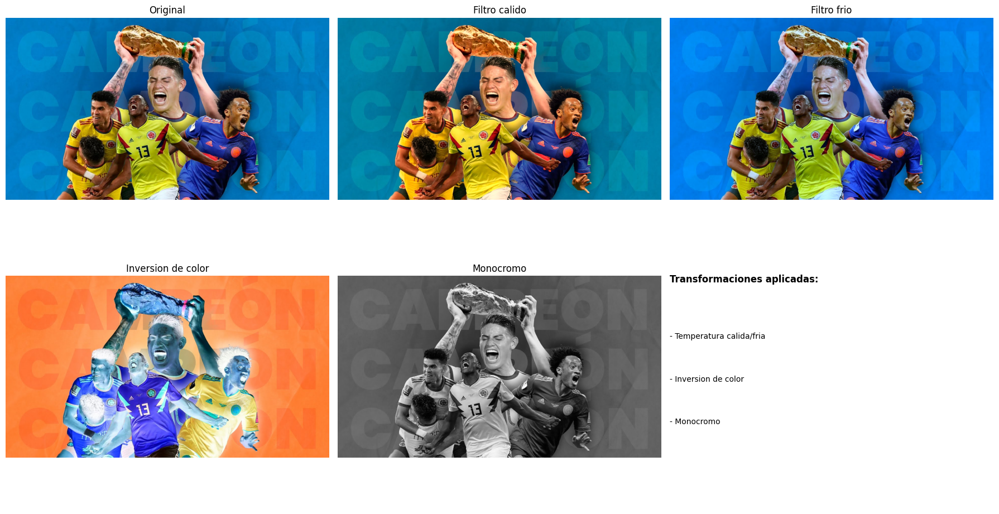

Guardado: image1_transformaciones.png


In [7]:
def warm_filter(img_rgb: np.ndarray, strength: float = 0.15) -> np.ndarray:
    img = img_rgb.astype(np.float32) / 255.0
    # Aumenta rojos, reduce azules para simular temperatura calida
    img[:, :, 0] = np.clip(img[:, :, 0] * (1.0 + strength), 0.0, 1.0)
    img[:, :, 2] = np.clip(img[:, :, 2] * (1.0 - strength * 0.8), 0.0, 1.0)
    return (img * 255).astype(np.uint8)

def cool_filter(img_rgb: np.ndarray, strength: float = 0.15) -> np.ndarray:
    img = img_rgb.astype(np.float32) / 255.0
    img[:, :, 2] = np.clip(img[:, :, 2] * (1.0 + strength), 0.0, 1.0)
    img[:, :, 0] = np.clip(img[:, :, 0] * (1.0 - strength * 0.8), 0.0, 1.0)
    return (img * 255).astype(np.uint8)

def invert_filter(img_rgb: np.ndarray) -> np.ndarray:
    return 255 - img_rgb

def monochrome_filter(img_rgb: np.ndarray) -> np.ndarray:
    gray = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2GRAY)
    return cv2.cvtColor(gray, cv2.COLOR_GRAY2RGB)

img_warm = warm_filter(img_rgb, strength=0.20)
img_cool = cool_filter(img_rgb, strength=0.20)
img_invert = invert_filter(img_rgb)
img_mono = monochrome_filter(img_rgb)

fig, ax = plt.subplots(2, 3, figsize=(18, 10))
ax[0, 0].imshow(img_rgb)
ax[0, 0].set_title('Original')
ax[0, 0].axis('off')

ax[0, 1].imshow(img_warm)
ax[0, 1].set_title('Filtro calido')
ax[0, 1].axis('off')

ax[0, 2].imshow(img_cool)
ax[0, 2].set_title('Filtro frio')
ax[0, 2].axis('off')

ax[1, 0].imshow(img_invert)
ax[1, 0].set_title('Inversion de color')
ax[1, 0].axis('off')

ax[1, 1].imshow(img_mono)
ax[1, 1].set_title('Monocromo')
ax[1, 1].axis('off')

ax[1, 2].axis('off')
ax[1, 2].text(0, 0.8, 'Transformaciones aplicadas:', fontsize=12, weight='bold')
ax[1, 2].text(0, 0.6, '- Temperatura calida/fria')
ax[1, 2].text(0, 0.45, '- Inversion de color')
ax[1, 2].text(0, 0.3, '- Monocromo')

plt.tight_layout()
out_path = OUTPUT_DIR / f'{image_path.stem}_transformaciones.png'
fig.savefig(out_path, dpi=150, bbox_inches='tight')
plt.show()

print('Guardado:', out_path.name)

## 6) Bonus: alternar dinamicamente entre modelos/simulaciones

In [ ]:
def apply_mode(img_rgb: np.ndarray, mode: str) -> np.ndarray:
    mode = mode.lower().strip()

    if mode == 'original':
        return img_rgb
    if mode == 'hsv_rgb':
        hsv = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2HSV)
        return cv2.cvtColor(hsv, cv2.COLOR_HSV2RGB)
    if mode == 'lab_rgb':
        lab = color.rgb2lab(img_rgb / 255.0)
        return np.clip(color.lab2rgb(lab) * 255, 0, 255).astype(np.uint8)
    if mode == 'protanopia':
        return apply_color_matrix(img_rgb, PROTANOPIA_MAT)
    if mode == 'deuteranopia':
        return apply_color_matrix(img_rgb, DEUTERANOPIA_MAT)
    if mode == 'baja_luz':
        return adjust_brightness_contrast(img_rgb, alpha=0.8, beta=-45)
    if mode == 'invert':
        return invert_filter(img_rgb)
    if mode == 'monocromo':
        return monochrome_filter(img_rgb)
    if mode == 'warm':
        return warm_filter(img_rgb, strength=0.2)
    if mode == 'cool':
        return cool_filter(img_rgb, strength=0.2)

    raise ValueError(f'Modo no soportado: {mode}')

def show_mode(img_rgb: np.ndarray, mode: str):
    transformed = apply_mode(img_rgb, mode)
    fig, ax = plt.subplots(1, 2, figsize=(14, 5))
    ax[0].imshow(img_rgb)
    ax[0].set_title('Original')
    ax[0].axis('off')

    ax[1].imshow(transformed)
    ax[1].set_title(f'Modo: {mode}')
    ax[1].axis('off')

    plt.tight_layout()
    plt.show()

# Demostracion rapida
MODES = [
    'original', 'hsv_rgb', 'lab_rgb', 'protanopia', 'deuteranopia',
    'baja_luz', 'warm', 'cool', 'invert', 'monocromo'
]

for m in MODES[:4]:
    show_mode(img_rgb, m)

print('Modos disponibles:')
print(', '.join(MODES))

## 7) Procesamiento por lote (opcional)

Ejecuta esta celda para generar resultados de todas las imagenes encontradas y dejar evidencias en `media/`.

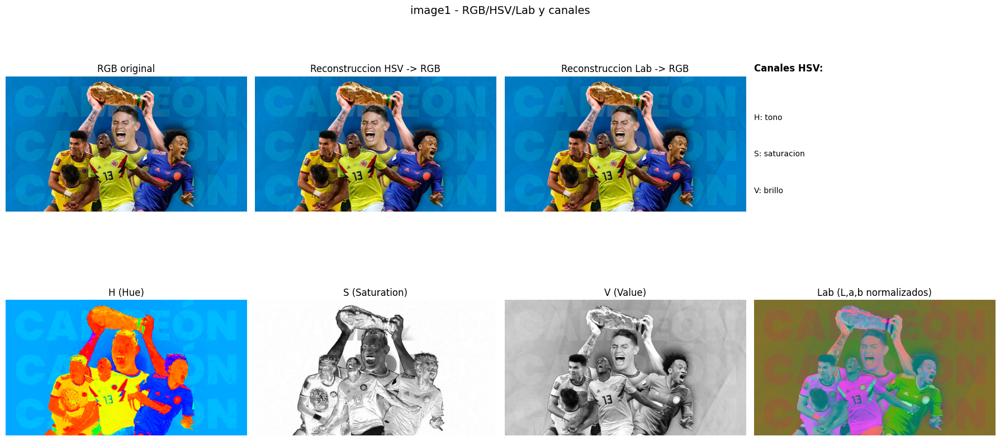

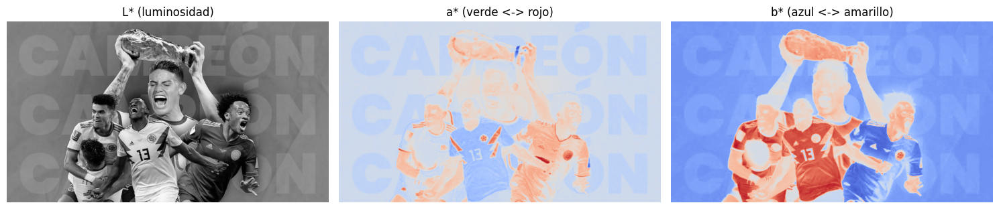

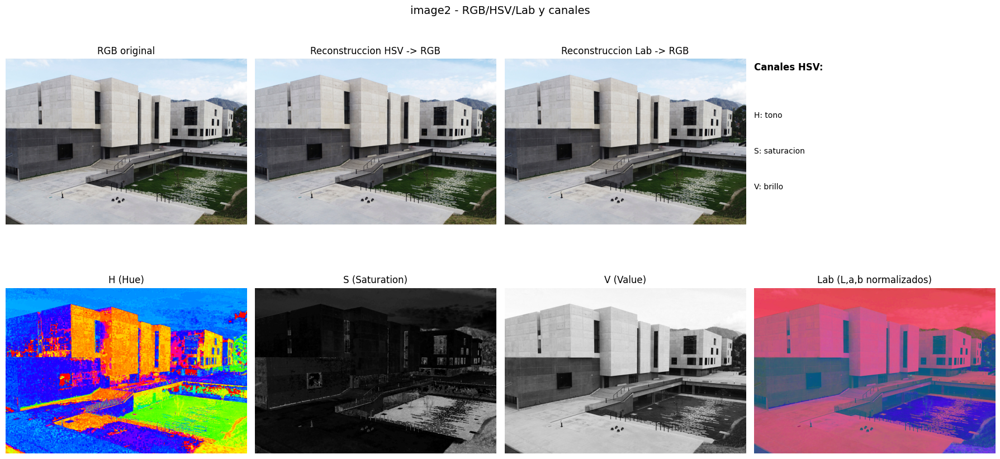

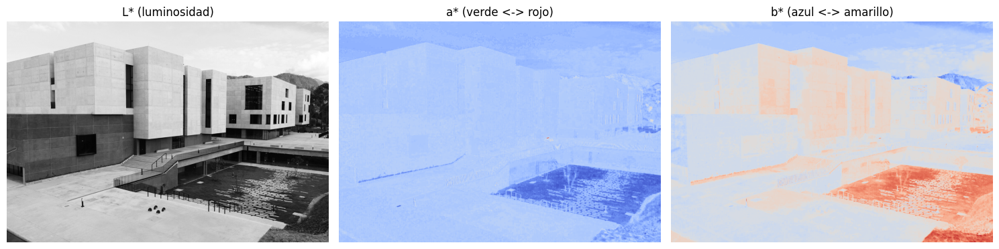

Procesamiento por lote finalizado.
Revisa la carpeta de salida: C:\Users\Juant\OneDrive\Desktop\Juan\Universidad\Visual-Computing-2026\Semana_04_Computacion_Radiometrica_Color\semana_04_2_modelos_color_percepcion\media


In [ ]:
for path in IMAGE_PATHS:
    img = load_rgb_image(path)
    stem = path.stem

    # 1) Conversiones + canales
    _ = plot_color_spaces_and_channels(img, stem, stem)

    # 2) Daltonismo
    prot = apply_color_matrix(img, PROTANOPIA_MAT)
    deut = apply_color_matrix(img, DEUTERANOPIA_MAT)
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(img); ax[0].set_title('Original'); ax[0].axis('off')
    ax[1].imshow(prot); ax[1].set_title('Protanopia'); ax[1].axis('off')
    ax[2].imshow(deut); ax[2].set_title('Deuteranopia'); ax[2].axis('off')
    plt.tight_layout()
    fig.savefig(OUTPUT_DIR / f'{stem}_daltonismo.png', dpi=150, bbox_inches='tight')
    plt.close(fig)

    # 3) Baja luz
    low = adjust_brightness_contrast(img, alpha=0.8, beta=-45)
    gamma = gamma_correction(img, gamma=1.8)
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(img); ax[0].set_title('Original'); ax[0].axis('off')
    ax[1].imshow(low); ax[1].set_title('Baja luz 1'); ax[1].axis('off')
    ax[2].imshow(gamma); ax[2].set_title('Baja luz 2'); ax[2].axis('off')
    plt.tight_layout()
    fig.savefig(OUTPUT_DIR / f'{stem}_baja_luz.png', dpi=150, bbox_inches='tight')
    plt.close(fig)

    # 4) Transformaciones
    warm = warm_filter(img, strength=0.2)
    cool = cool_filter(img, strength=0.2)
    inv = invert_filter(img)
    mono = monochrome_filter(img)
    fig, ax = plt.subplots(2, 3, figsize=(15, 8))
    ax[0,0].imshow(img);  ax[0,0].set_title('Original'); ax[0,0].axis('off')
    ax[0,1].imshow(warm); ax[0,1].set_title('Warm');     ax[0,1].axis('off')
    ax[0,2].imshow(cool); ax[0,2].set_title('Cool');     ax[0,2].axis('off')
    ax[1,0].imshow(inv);  ax[1,0].set_title('Invert');   ax[1,0].axis('off')
    ax[1,1].imshow(mono); ax[1,1].set_title('Monocromo');ax[1,1].axis('off')
    ax[1,2].axis('off')
    plt.tight_layout()
    fig.savefig(OUTPUT_DIR / f'{stem}_transformaciones.png', dpi=150, bbox_inches='tight')
    plt.close(fig)

    # 5) Bonus: evidencias del alternador (grid de modos)
    modes_grid = [
        'original', 'hsv_rgb', 'lab_rgb', 'protanopia', 'deuteranopia',
        'baja_luz', 'warm', 'cool', 'invert', 'monocromo'
    ]
    shown = modes_grid[:6]  # 2x3
    fig, ax = plt.subplots(2, 3, figsize=(15, 8))
    for j, mode in enumerate(shown):
        r, c = divmod(j, 3)
        ax[r, c].imshow(apply_mode(img, mode))
        ax[r, c].set_title(mode)
        ax[r, c].axis('off')
    plt.tight_layout()
    fig.savefig(OUTPUT_DIR / f'{stem}_switcher.png', dpi=150, bbox_inches='tight')
    plt.close(fig)

print('Procesamiento por lote finalizado.')
print('Revisa la carpeta de salida:', OUTPUT_DIR.resolve())